### K-Means Clustering

K-Means is a simple yet powerful clustering algorithm used in unsupervised learning. It partitions a dataset into **K clusters** based on feature similarity.

---

### Overview
**Goal**: Divide data into \( K \) clusters where each point belongs to the cluster with the nearest mean (centroid).

**Steps**:
1. Initialize \( K \) centroids randomly.
2. Assign each data point to the nearest centroid.
3. Update the centroids by calculating the mean of all points assigned to each cluster.
4. Repeat steps 2 and 3 until convergence (no change in centroids or a maximum number of iterations is reached).

---

### Step-by-Step Implementation

Here's a simple implementation of K-Means clustering from scratch using Python.

#### 1. **Import Libraries**



In [76]:

import numpy as np
import matplotlib.pyplot as plt


#### 2. **Generate a Dataset**

For simplicity, we will generate synthetic data.


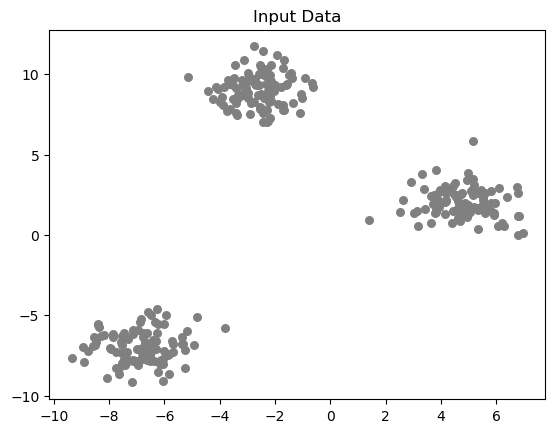

In [78]:

from sklearn.datasets import make_blobs

# Generate sample data with 3 clusters
data, _ = make_blobs(n_samples=300, centers=3, random_state=42, cluster_std=1.0)

# Plot the dataset
plt.scatter(data[:, 0], data[:, 1], s=30, color='gray')
plt.title("Input Data")
plt.show()


`n_samples=300`: This specifies the total number of data points (samples) to generate. In this case, 300 samples will be created.
`centers=3`: This sets the number of centers (or clusters) to generate. Here, the data will be grouped into 3 distinct clusters.
`random_state=42`: This ensures reproducibility of the dataset. By setting a seed value (42 in this case), the same dataset will be generated each time the code is run.
`cluster_std=1.0`: This controls the standard deviation of the clusters. A standard deviation of 1.0 means the clusters will have a moderate spread.

#### 3. **Initialize Centroids**

Randomly select \( K \) data points as the initial centroids.


In [80]:

def initialize_centroids(data, k):
    """Randomly select k data points as initial centroids."""
    indices = np.random.choice(data.shape[0], size=k, replace=False)
    return data[indices]


#### 4. **Assign Clusters**

For each data point, find the nearest centroid and assign it to that cluster.


In [82]:

def assign_clusters(data, centroids):
    """Assign each data point to the nearest centroid."""
    distances = np.linalg.norm(data[:, np.newaxis] - centroids, axis=2)
    return np.argmin(distances, axis=1)


#### 5. **Update Centroids**

Recompute the centroids as the mean of all data points assigned to each cluster.


In [84]:

def update_centroids(data, labels, k):
    """Compute the new centroids as the mean of points in each cluster."""
    centroids = np.array([data[labels == i].mean(axis=0) for i in range(k)])
    return centroids


- The list comprehension [data[labels == i].mean(axis=0) for i in range(k)] iterates over each cluster index i from 0 to k-1.
- For each cluster i, it selects the data points that belong to that cluster (`data[labels == i]`).
- It then computes the mean of these points along the feature axis (`axis=0`), resulting in the new centroid for that cluster.
- Finally, it converts the list of centroids into a NumPy array.

#### 6. **Define the K-Means Algorithm**

Combine all the steps into a single function.



In [86]:

def k_means(data, k, max_iters=100):
    """K-Means clustering algorithm."""
    # Step 1: Initialize centroids
    centroids = initialize_centroids(data, k)

    for _ in range(max_iters):
        # Step 2: Assign clusters
        labels = assign_clusters(data, centroids)

        # Step 3: Update centroids
        new_centroids = update_centroids(data, labels, k)

        # Convergence check
        if np.all(centroids == new_centroids):
            break
        centroids = new_centroids

    return labels, centroids


#### 7. **Run the Algorithm**


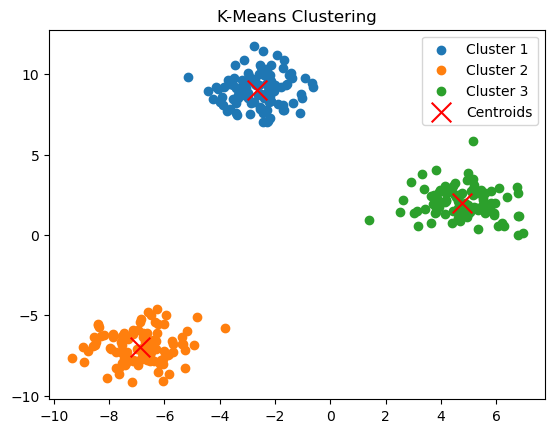

In [88]:

k = 3  # Number of clusters
labels, centroids = k_means(data, k)

# Plot the results
for i in range(k):
    plt.scatter(data[labels == i][:, 0], data[labels == i][:, 1], label=f"Cluster {i+1}")
plt.scatter(centroids[:, 0], centroids[:, 1], color='red', marker='x', s=200, label="Centroids")
plt.legend()
plt.title("K-Means Clustering")
plt.show()


---

### Explanation of Results
- The **clusters** represent groups of similar data points.
- The **centroids** are the central points of these clusters.

---

### Notes
1. **Limitations**:
   - Sensitive to initial centroid placement (may converge to local minima).
   - Requires specifying \( K \) in advance.
2. **Improvements**:
   - Use the **K-Means++** algorithm to initialize centroids smartly.

Below is a basic tutorial to implement the **K-Nearest Neighbors (KNN)** algorithm from scratch in Python. KNN is a simple yet effective algorithm for classification and regression tasks.

https://www.youtube.com/watch?v=4b5d3muPQmA&ab_channel=StatQuestwithJoshStarmer

---

# **K-Nearest Neighbors (KNN)**
https://www.javatpoint.com/k-nearest-neighbor-algorithm-for-machine-learning

### **1. What is KNN?**
K-Nearest Neighbors is a supervised learning algorithm used for classification and regression. It classifies a data point based on the majority vote of its 'k' nearest neighbors. For regression, it predicts the average of the 'k' nearest neighbors.

### **2. Steps in KNN**
1. Choose the number of neighbors, \( k \).
2. Compute the distance between the test data point and all training data points.
3. Sort the distances and select the \( k \) nearest neighbors.
4. For classification:
   - Take a majority vote among the \( k \) nearest neighbors.
   - Assign the most frequent class to the test data point.
5. For regression:
   - Calculate the mean value of the \( k \) nearest neighbors.

---

### **3. Implementation**

#### **3.1 Import Libraries**


In [91]:

import numpy as np
from collections import Counter


#### **3.2 Create the Distance Function**
The most common distance metric is **Euclidean Distance**:
\[ \text{Distance} = \sqrt{\sum_{i=1}^n (x_i - y_i)^2} \]


In [93]:
def euclidean_distance(point1, point2):
    return np.sqrt(np.sum((np.array(point1) - np.array(point2)) ** 2))

#### **3.3 Define the KNN Class**


In [95]:

class KNN:
    def __init__(self, k=3):
        self.k = k

    def fit(self, X, y):
        """
        Store the training data.
        """
        self.X_train = X
        self.y_train = y

    def predict(self, X):
        """
        Predict the labels for the given input data.
        """
        predictions = [self._predict(x) for x in X]
        return np.array(predictions)

    def _predict(self, x):
        """
        Predict the label for a single data point.
        """
        # Calculate distances between x and all training points
        distances = [euclidean_distance(x, x_train) for x_train in self.X_train]

        # Get the indices of the k nearest neighbors
        k_indices = np.argsort(distances)[:self.k]

        # Get the labels of the k nearest neighbors
        k_neighbor_labels = [self.y_train[i] for i in k_indices]

        # Majority vote for classification
        most_common = Counter(k_neighbor_labels).most_common(1)
        return most_common[0][0]




---
### **4. Testing the KNN Class**

#### **4.1 Create a Simple Dataset**

In [97]:

from sklearn.model_selection import train_test_split

# Example dataset
X = [[1, 2], [2, 3], [3, 1], [6, 5], [7, 7], [8, 6]]
y = [0, 0, 0, 1, 1, 1]  # Binary classification

# Split dataset into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)


#### **4.2 Train and Test the KNN Classifier**


In [99]:

# Instantiate the KNN model
knn = KNN(k=3)

# Fit the model with training data
knn.fit(X_train, y_train)

# Predict on the test data
predictions = knn.predict(X_test)

# Print the results
print("Predictions:", predictions)
print("Actual labels:", y_test)



Predictions: [1 1]
Actual labels: [0, 0]


---
### **5. Evaluate the Model**

#### **5.1 Accuracy**

In [101]:


accuracy = np.mean(predictions == y_test)
print("Accuracy:", accuracy)



Accuracy: 0.0


---

### **6. Customizations**
- **Change Distance Metric:** Replace `euclidean_distance` with other metrics like Manhattan distance.
- **Hyperparameter \( k \):** Experiment with different values of \( k \).
- **Use for Regression:** Replace the voting mechanism with the mean of the \( k \)-nearest neighbors.

---

### **7. Visualizing the Results**
(Optional) You can use `matplotlib` to visualize the decision boundary of KNN if your dataset has two features.

---

# PCA
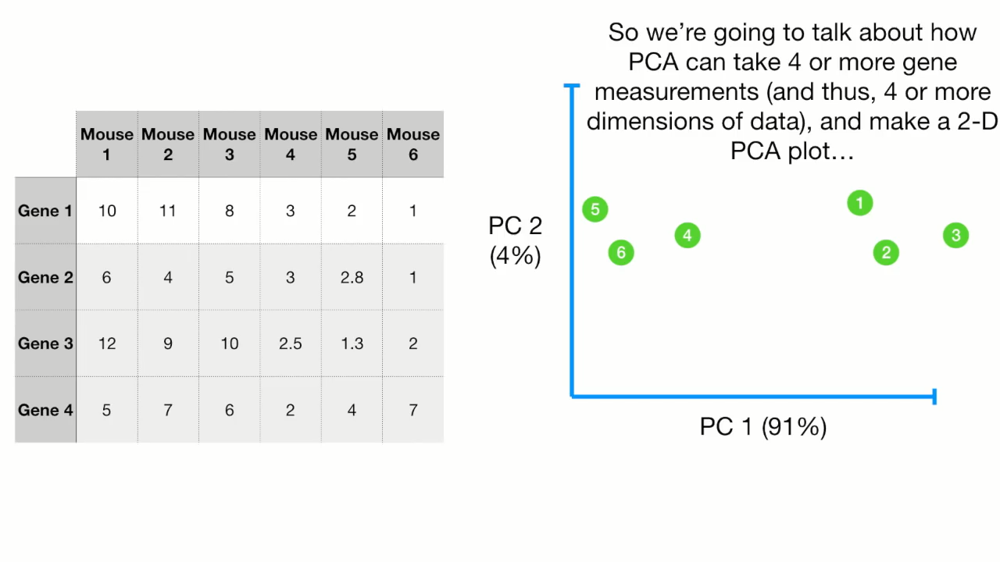
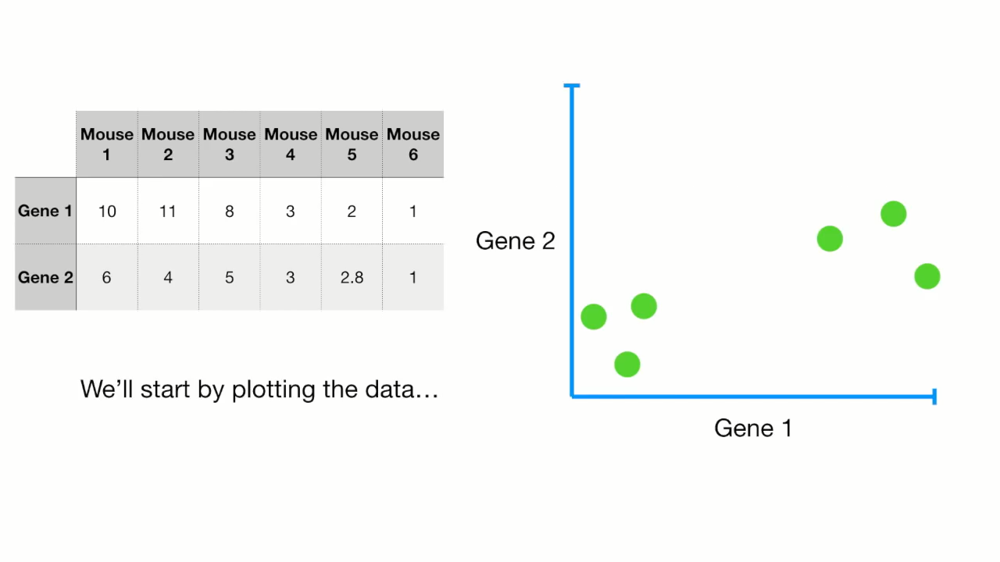
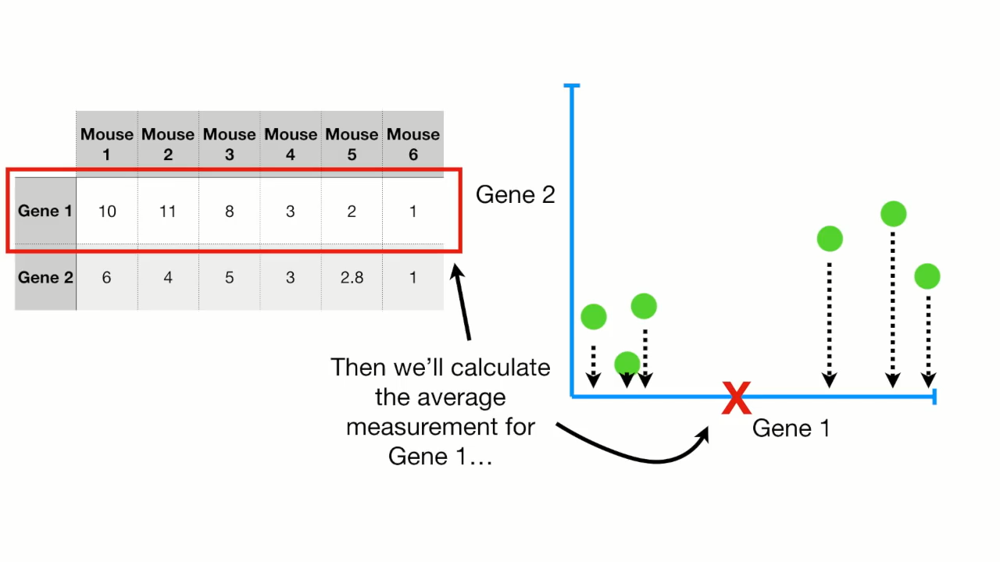
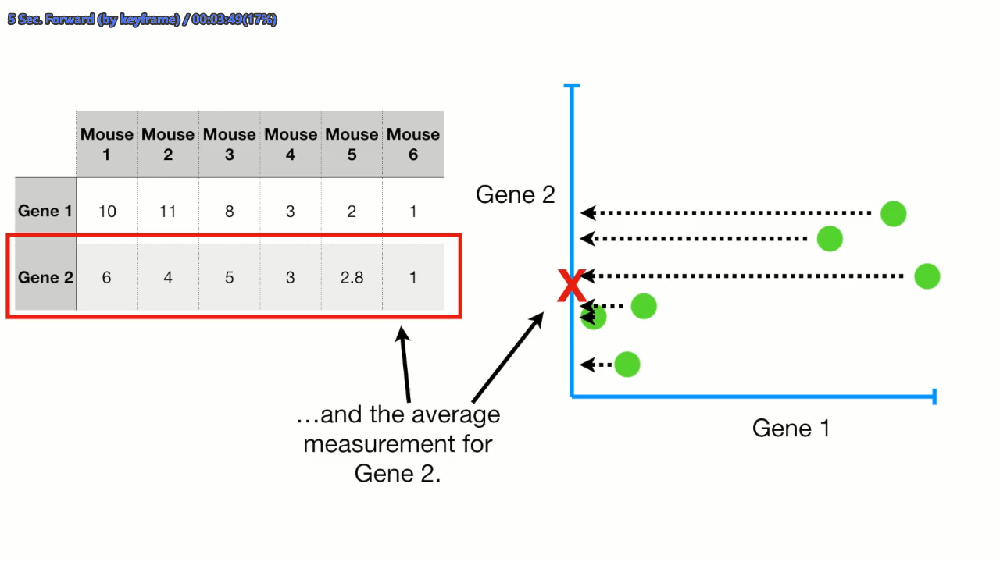
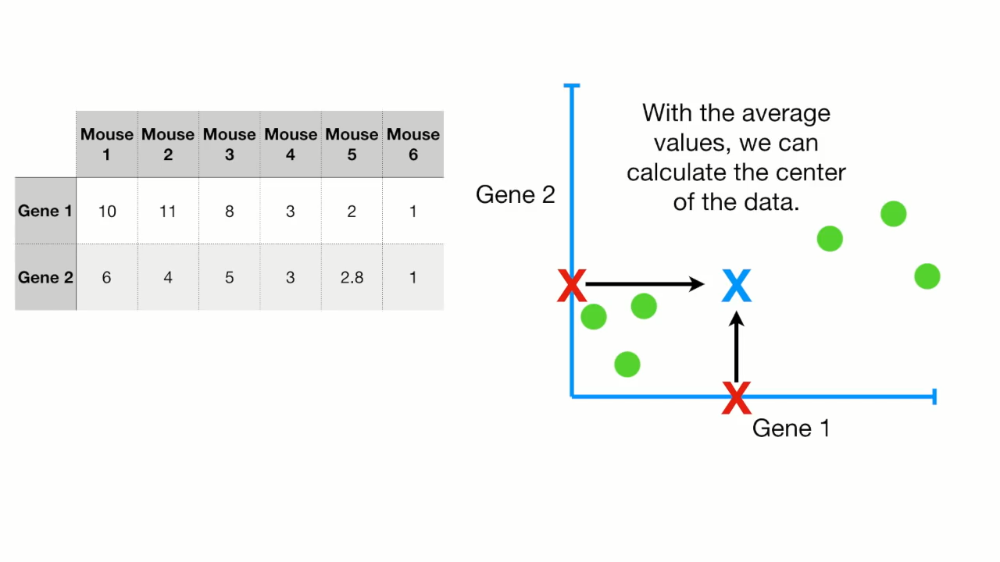
...
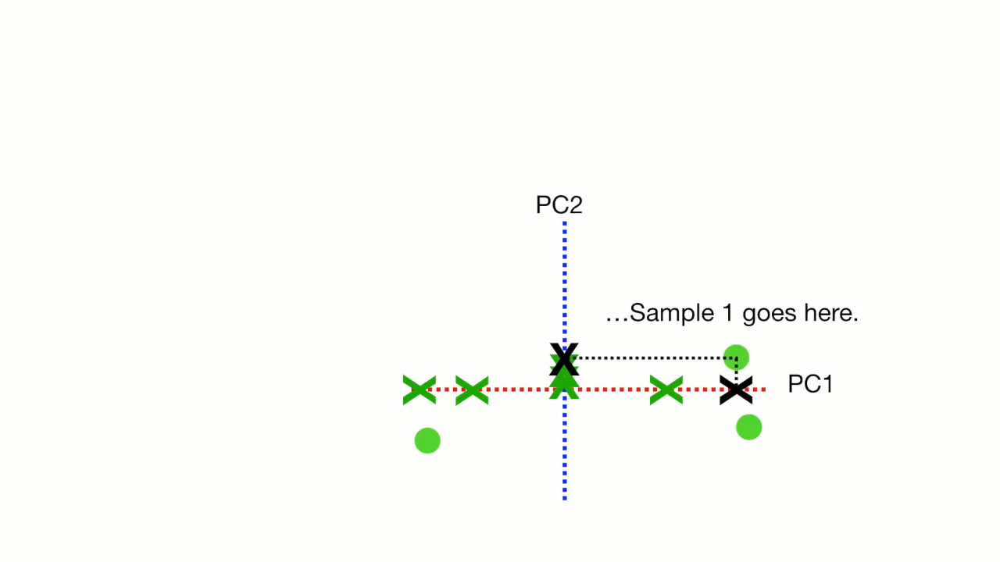
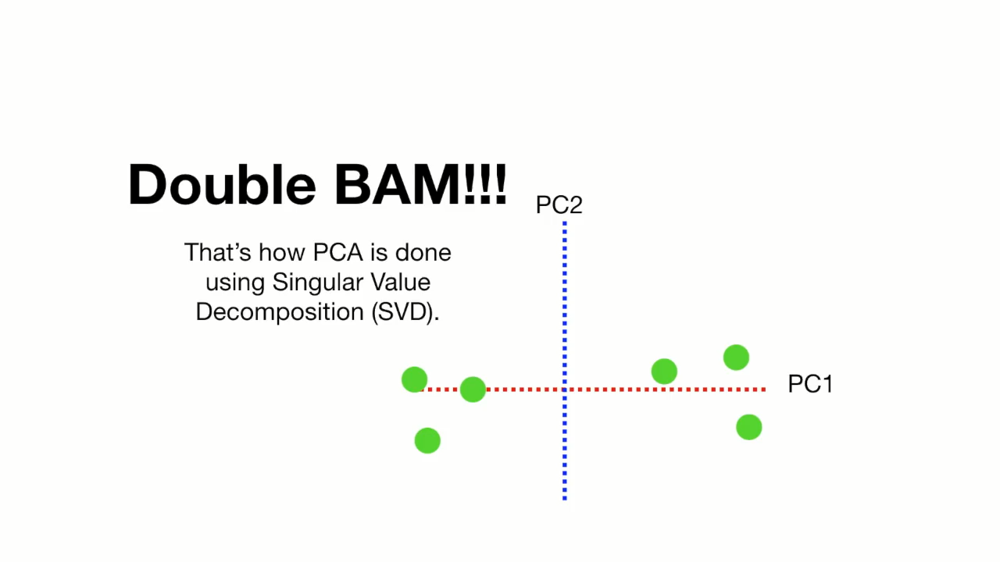
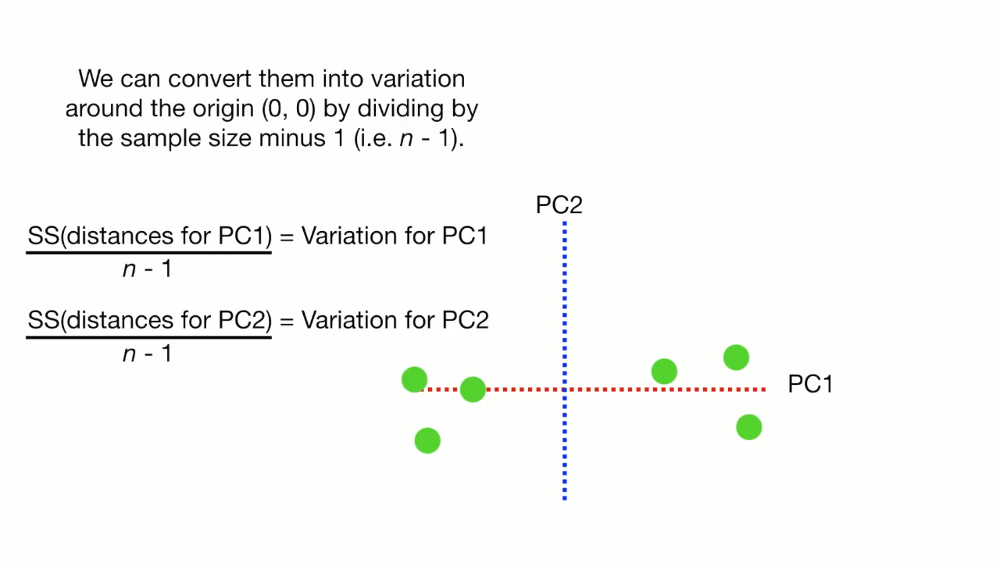
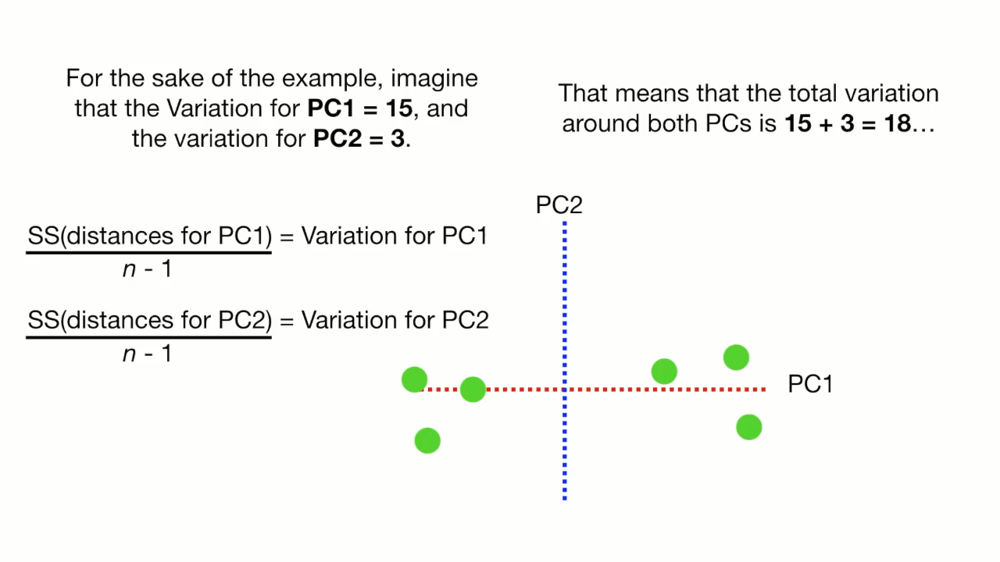
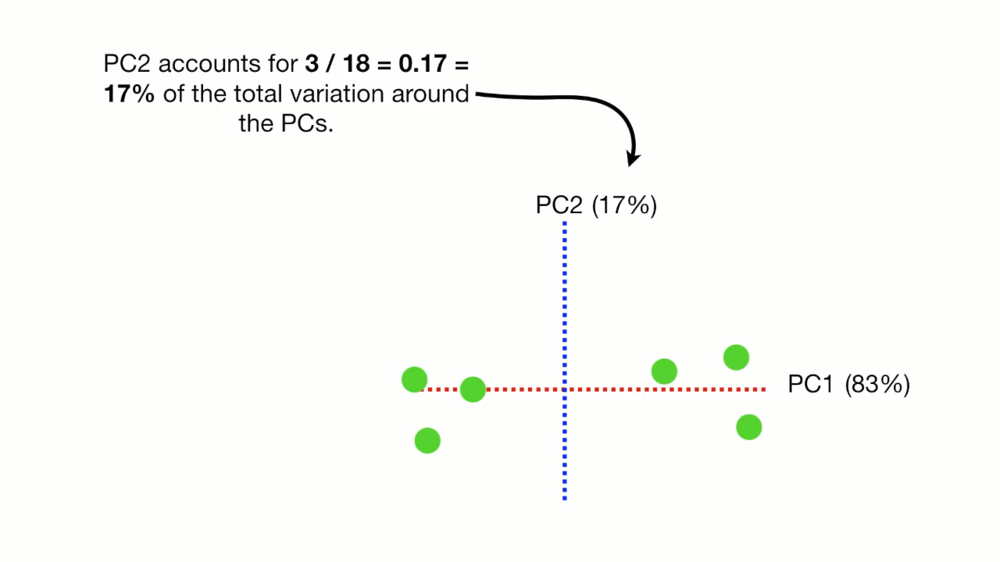

## Background for PCA in math
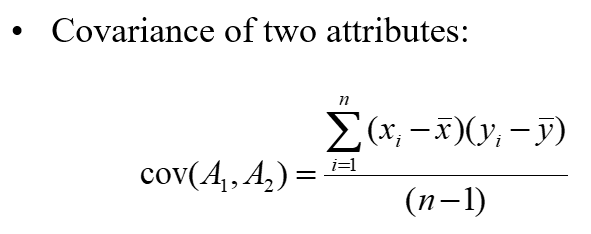
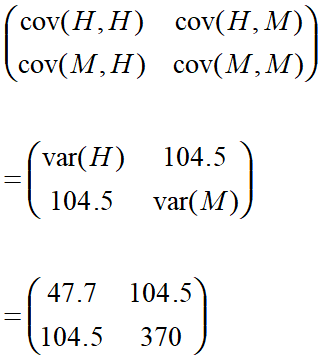
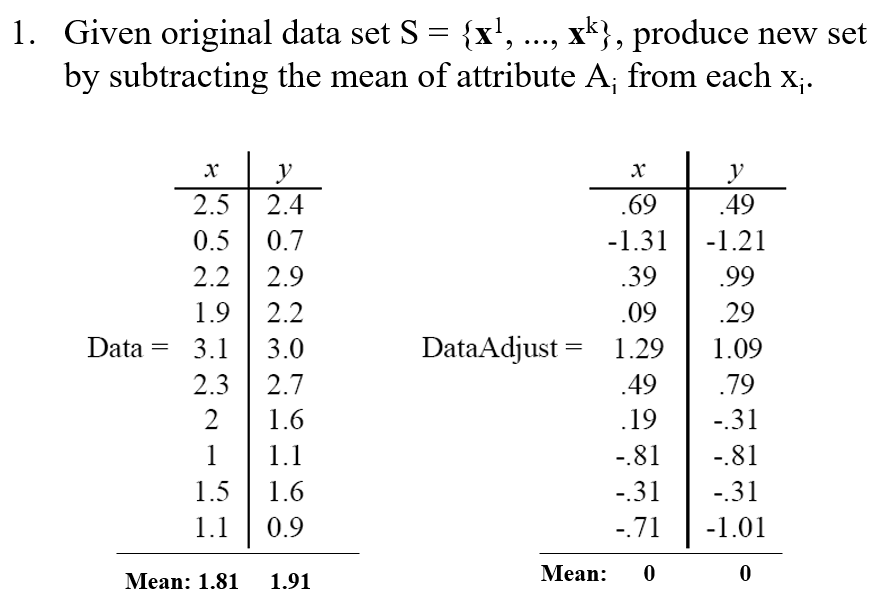
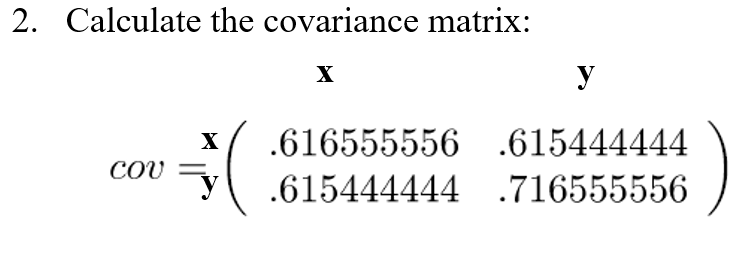

---

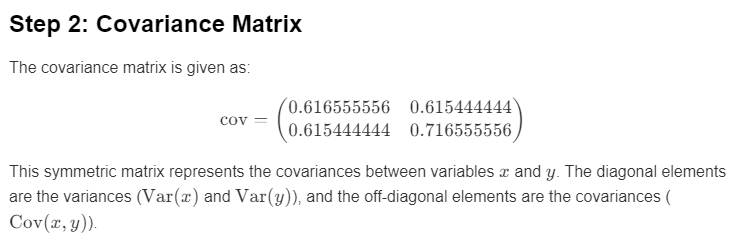

---

### **Step 3: Eigenvalues and Eigenvectors**
Eigenvalues and eigenvectors are computed from the covariance matrix by solving the eigenvalue equation:

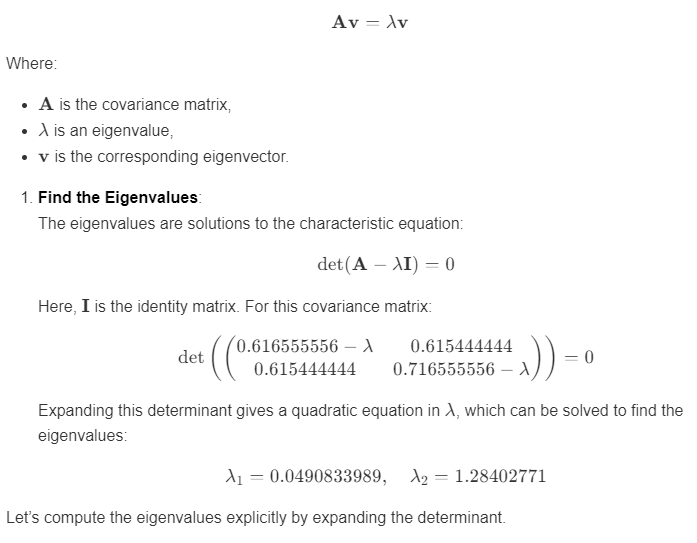
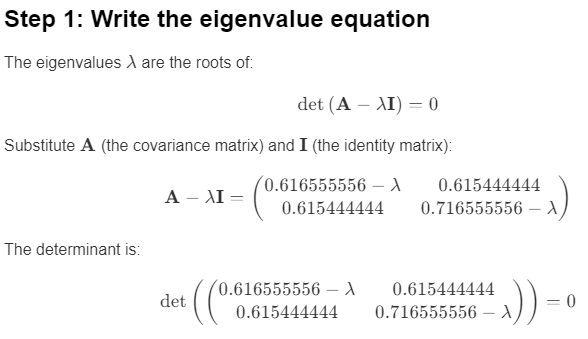
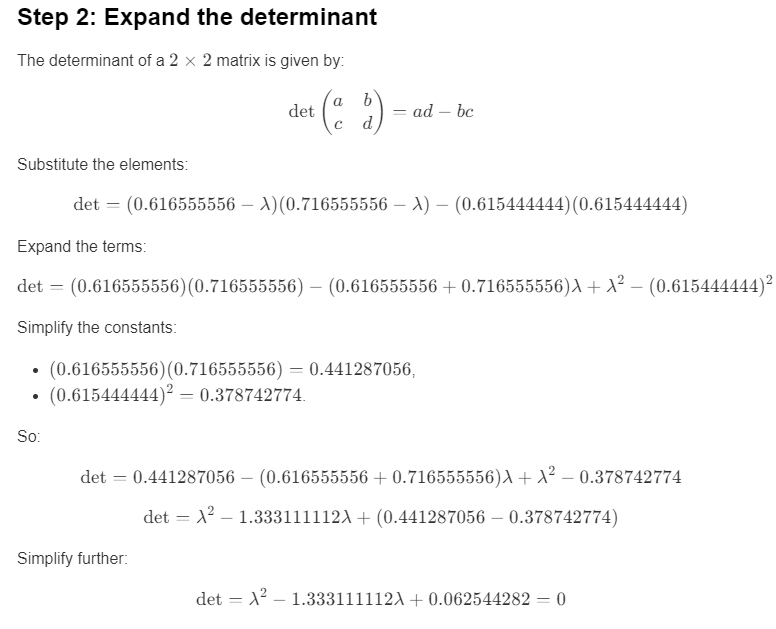
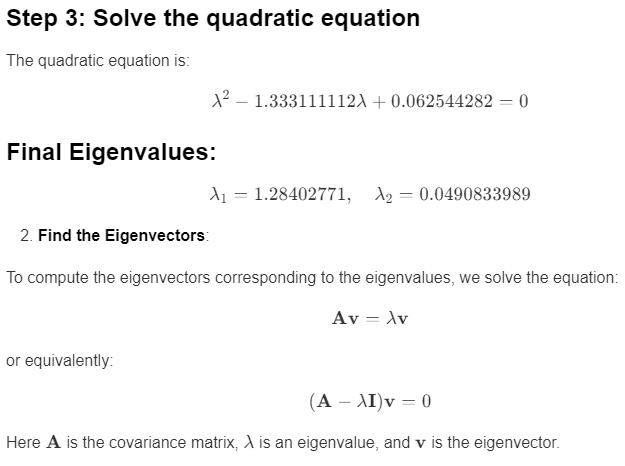

---

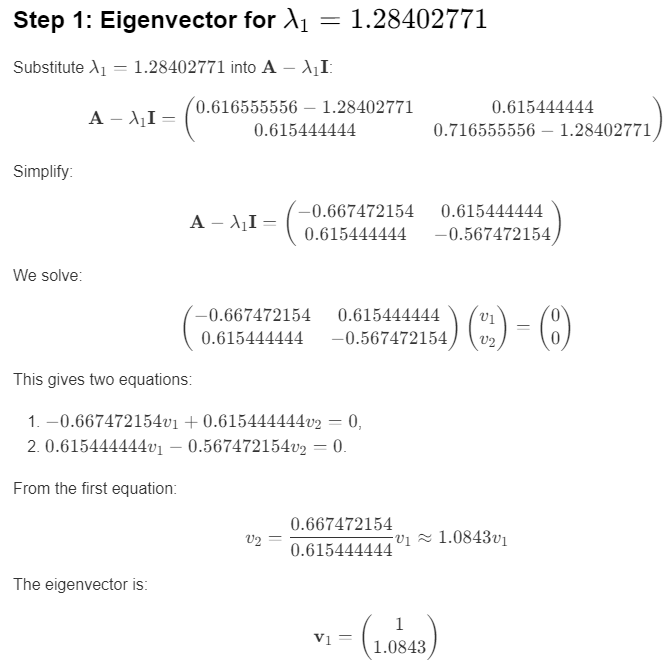
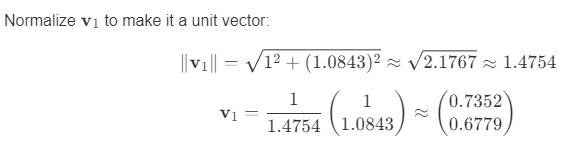

---

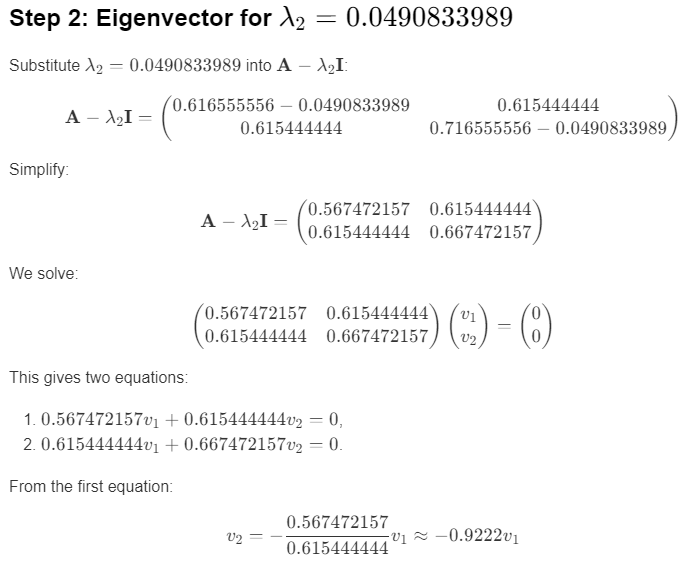
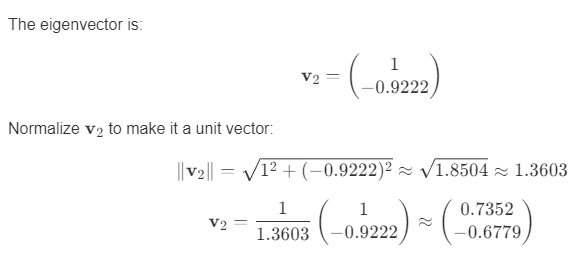

---

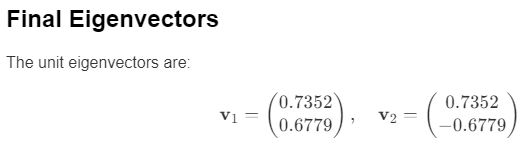

https://www.youtube.com/watch?v=FgakZw6K1QQ&pp=ygUNcGNhIHN0YXRxdWVzdA%3D%3D

### Defination
Principal Component Analysis (PCA) is a widely used dimensionality reduction technique in machine learning. It reduces the number of features in a dataset while preserving as much information as possible. PCA achieves this by identifying new axes (principal components) that maximize variance.

---

## **1. Why PCA?**

- **High-Dimensional Data**: High-dimensional datasets can lead to overfitting and computational inefficiency.
- **Noise Reduction**: PCA eliminates features that contribute minimal variance, reducing noise.
- **Visualization**: PCA is often used to project data into 2D or 3D for visualization.

---

## **2. Steps in PCA**

1. **Standardize the Data**: Scale the data to have zero mean and unit variance.
2. **Compute Covariance Matrix**: Identify relationships between features.
3. **Perform Eigen Decomposition**: Obtain eigenvalues (variance explained) and eigenvectors (principal components).
4. **Sort Eigenvectors**: Rank them by corresponding eigenvalues in descending order.
5. **Project the Data**: Transform the data into the new feature space using top components.

---

## **3. PCA in Python**

### **Step 1: Import Libraries**


In [104]:

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler


### **Step 2: Load the Dataset**
Use any dataset. Here, we'll use the Iris dataset as an example:


In [106]:

from sklearn.datasets import load_iris

# Load dataset
data = load_iris()
X = data.data
y = data.target

# Convert to DataFrame
df = pd.DataFrame(X, columns=data.feature_names)
df['target'] = y


### **Step 3: Standardize the Features**


In [108]:

# Standardize features
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)


### **Step 4: Apply PCA**


In [110]:
# Apply PCA
pca = PCA(n_components=2)  # Reduce to 2 components
X_pca = pca.fit_transform(X_scaled)

# Variance explained by each component
print("Explained variance ratio:", pca.explained_variance_ratio_)


Explained variance ratio: [0.72962445 0.22850762]


### **Step 5: Visualize Results**


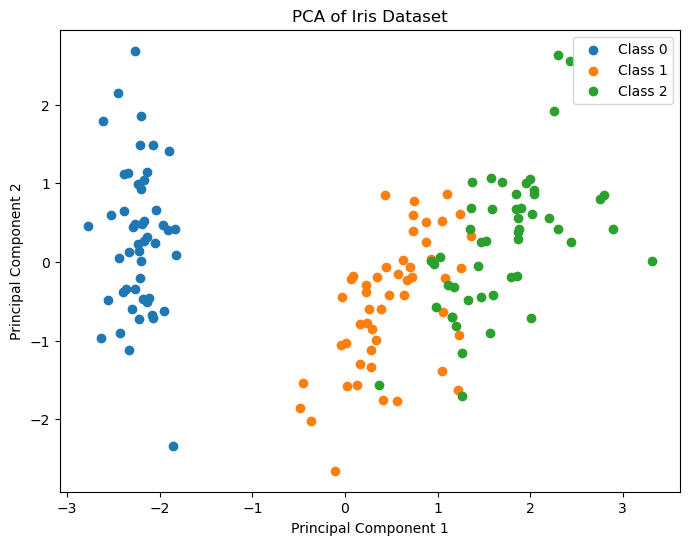

In [112]:

# Plot PCA projection
plt.figure(figsize=(8, 6))
for target in np.unique(y):
    plt.scatter(X_pca[y == target, 0], X_pca[y == target, 1], label=f'Class {target}')

plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 2')
plt.title('PCA of Iris Dataset')
plt.legend()
plt.show()


---

## **4. Interpreting Results**

- **Explained Variance Ratio**: Indicates how much information (variance) each principal component captures.
- **Reduced Features**: Data is now represented by fewer dimensions, making models faster and less prone to overfitting.

---

## **5. Practical Tips**

- **Standardize Features**: PCA is sensitive to feature scaling.
- **Choose n_components Wisely**: Use `explained_variance_ratio_` to decide the number of components.
- **Interpretability**: PCA is unsupervised; ensure reduced features align with the problem's requirements.

---

## **6. PCA for High-Dimensional Data**
---
For datasets with hundreds of features, PCA can drastically reduce dimensions:


In [114]:

pca = PCA(n_components=0.95)  # Keep 95% of variance
X_reduced = pca.fit_transform(X_scaled)
print(f"Reduced dimensions: {X_reduced.shape[1]}")


Reduced dimensions: 2


# Support Vectors machine

SVM is a supervised learning algorithm that finds the best decision boundary (hyperplane) to separate different classes in the feature space. It aims to maximize the margin between data points of different classes.

Key terms:
- **Hyperplane**: A boundary that separates data points of different classes.
- **Margin**: The distance between the hyperplane and the nearest data points from each class (support vectors).

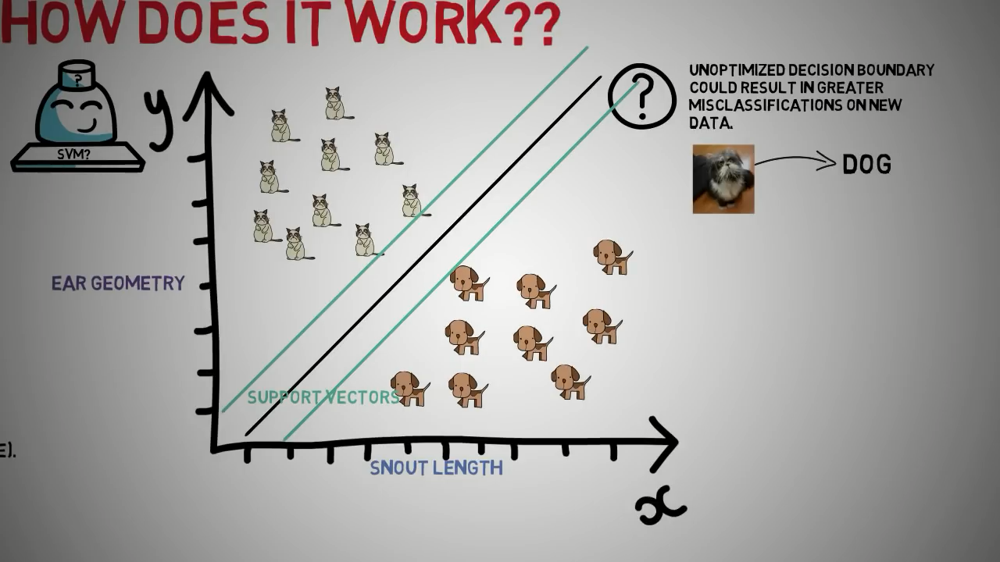
### **Linear SVM**
If the data is linearly separable, SVM finds a straight-line hyperplane (in 2D) or a flat hyperplane (in higher dimensions) to separate classes.

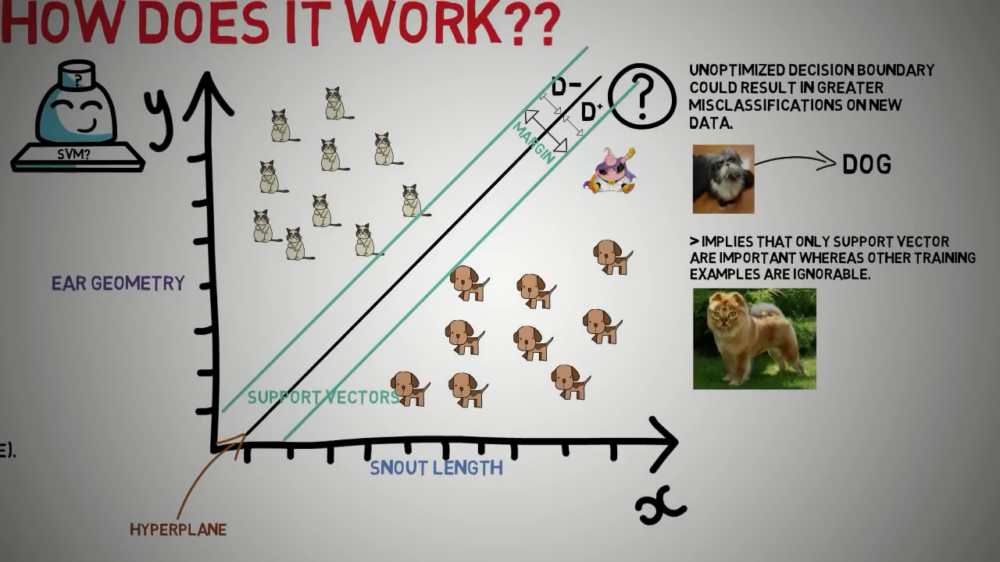
### **Non-linear SVM with Kernels**
Real-world data is often non-linear. SVM uses the "kernel trick" to transform the data into a higher-dimensional space where it becomes linearly separable. Common kernels:
- **Linear Kernel**: For linearly separable data.
- **Polynomial Kernel**: For curved boundaries.
- **Radial Basis Function (RBF) Kernel**: Popular for non-linear problems.

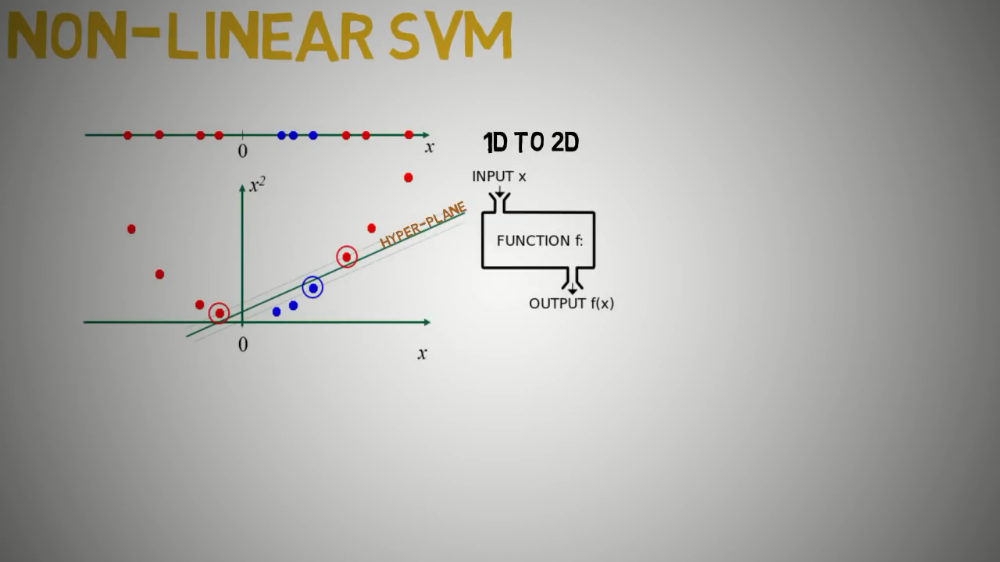
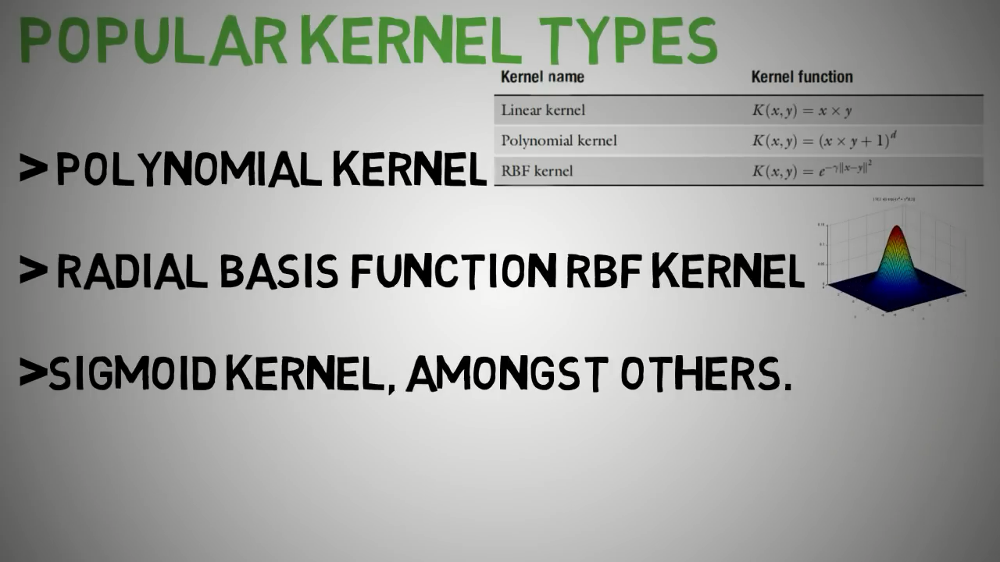
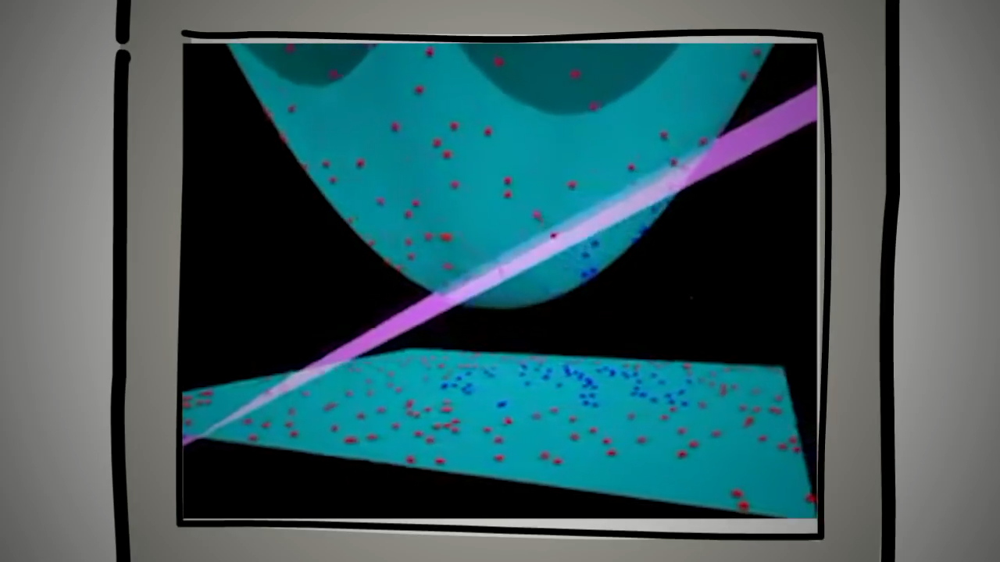


### **Advantages**
- Effective in high-dimensional spaces.
- Works well for small to medium-sized datasets.
- Handles non-linear data with kernel functions.

### **Limitations**
- Computationally intensive for large datasets.
- Choosing the right kernel and hyperparameters can be challenging.
- Not suitable for noisy datasets with overlapping classes.

---

## 4. Implementing SVM in Python

### **Installation**
Ensure you have `scikit-learn` installed. You can install it using:


In [116]:
pip install scikit-learn


Note: you may need to restart the kernel to use updated packages.


### **Linear SVM for Binary Classification**


Accuracy: 1.0
              precision    recall  f1-score   support

           0       1.00      1.00      1.00        16
           1       1.00      1.00      1.00        14

    accuracy                           1.00        30
   macro avg       1.00      1.00      1.00        30
weighted avg       1.00      1.00      1.00        30



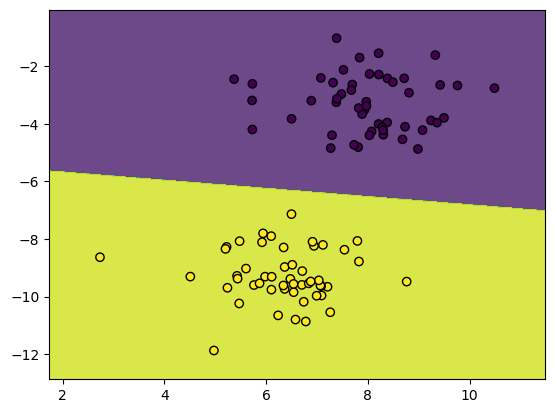

In [118]:

import numpy as np
import matplotlib.pyplot as plt
from sklearn.datasets import make_blobs
from sklearn.model_selection import train_test_split
from sklearn.svm import SVC
from sklearn.metrics import accuracy_score, classification_report

# Generate synthetic data
X, y = make_blobs(n_samples=100, centers=2, random_state=6)

# Split data into training and test sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

# Create and train the SVM model
linear_svm = SVC(kernel='linear', C=1)
linear_svm.fit(X_train, y_train)

# Make predictions
y_pred = linear_svm.predict(X_test)

# Evaluate the model
print(f"Accuracy: {accuracy_score(y_test, y_pred)}")
print(classification_report(y_test, y_pred))

# Plot decision boundary
def plot_decision_boundary(X, y, model):
    x_min, x_max = X[:, 0].min() - 1, X[:, 0].max() + 1
    y_min, y_max = X[:, 1].min() - 1, X[:, 1].max() + 1
    xx, yy = np.meshgrid(np.arange(x_min, x_max, 0.01),
                         np.arange(y_min, y_max, 0.01))
    Z = model.predict(np.c_[xx.ravel(), yy.ravel()])
    Z = Z.reshape(xx.shape)
    plt.contourf(xx, yy, Z, alpha=0.8)
    plt.scatter(X[:, 0], X[:, 1], c=y, edgecolors='k', marker='o')
    plt.show()

plot_decision_boundary(X, y, linear_svm)


### **SVM with RBF Kernel for Non-linear Data**


Accuracy: 1.0
              precision    recall  f1-score   support

           0       1.00      1.00      1.00        11
           1       1.00      1.00      1.00        19

    accuracy                           1.00        30
   macro avg       1.00      1.00      1.00        30
weighted avg       1.00      1.00      1.00        30



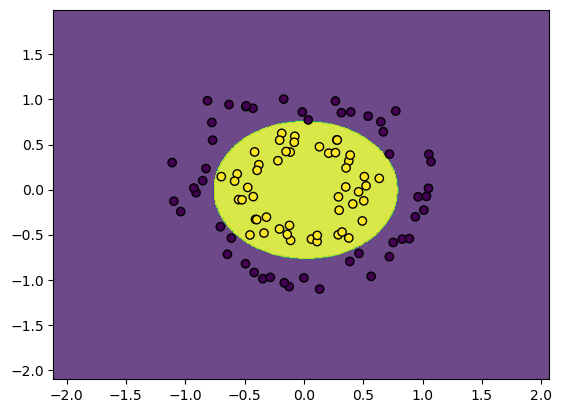

In [120]:

# Generate non-linear data
from sklearn.datasets import make_circles
X, y = make_circles(n_samples=100, factor=0.5, noise=0.1)

# Split data into training and test sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

# Create and train the SVM model with RBF kernel
rbf_svm = SVC(kernel='rbf', C=1, gamma=0.5)
rbf_svm.fit(X_train, y_train)

# Make predictions
y_pred = rbf_svm.predict(X_test)

# Evaluate the model
print(f"Accuracy: {accuracy_score(y_test, y_pred)}")
print(classification_report(y_test, y_pred))

# Plot decision boundary
plot_decision_boundary(X, y, rbf_svm)


---

## 5. Practical Tips and Use Cases

### **Tips**
- Normalize the data to improve SVM performance.
- Use grid search or cross-validation to tune hyperparameters like `C`, `kernel`, and `gamma`.
- SVM is sensitive to outliers; consider preprocessing your data.

### **Use Cases**
- Text classification (e.g., spam detection).
- Image classification.
- Bioinformatics (e.g., protein classification).
- Handwriting recognition.

---
